## **Hexaboard Visual Inspection**

In [1]:
# --- Default libraries ---
import os
import warnings
from pathlib import Path

# --- Working directory ---
PROJECT_DIR = Path().resolve()
PROJECT_ROOT_NAME = 'visual-inspection'

while PROJECT_DIR.name != PROJECT_ROOT_NAME and PROJECT_DIR != PROJECT_DIR.parent:
    PROJECT_DIR = PROJECT_DIR.parent

if Path().resolve() != PROJECT_DIR:
    os.chdir(PROJECT_DIR)

DATA_DIR = PROJECT_DIR / 'data'
LOG_DIR = PROJECT_DIR / 'logs'

# --- Data preprocessing & visualization ---
import numpy as np

# --- Deep learning ---
import torch
from torch.utils.data import DataLoader
from torchvision import transforms

# --- Custom modules ---
from src.configs import CNNAutoencoderConfig, TrainConfig
from src.engine import AutoencoderTrainer
from src.models import CNNAutoencoder
from src.utils import set_seed
from src.utils.data import HexaboardDataset
from src.utils.viz import *

# --- Settings ---
warnings.filterwarnings('ignore')
set_seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

### **1. Data Processing**

(13, 9, 1016, 1640, 3)


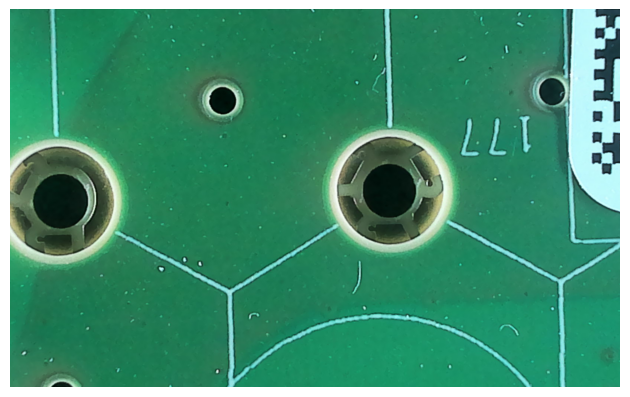

In [2]:
# Read the image
image = np.load(DATA_DIR / 'train' / 'aligned_images1.npy')

# Convert BGR to RGB
image = image[..., ::-1]
print(image.shape)

# Visualize segments
visualize_segments(
    data=image,
    num_samples=1,
    randomize=True
)

In [3]:
# Convert np.ndarray to torch.Tensor: (H, W, C) -> (C, H, W)
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Create the hexaboard datasets
train_dataset = HexaboardDataset(root=DATA_DIR / 'train', transform=transform)
val_dataset = HexaboardDataset(root=DATA_DIR / 'val', transform=transform)
test_dataset = HexaboardDataset(root=DATA_DIR / 'test', transform=transform)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

Train dataset size: 720
Validation dataset size: 90
Test dataset size: 90


### **2. Train the Model**

In [4]:
# Model configurations
model_config = CNNAutoencoderConfig(
    height=train_dataset.height,
    width=train_dataset.width,
    latent_dim=32,
    init_filters=128,
    layers=[2, 2, 2]
)

In [5]:
# Initialize the model
model = CNNAutoencoder(config=model_config).to(device)
model

CNNAutoencoder(
  (conv1): Conv2d(3, 128, kernel_size=(10, 16), stride=(5, 8), padding=(5, 0))
  (bn1): GroupNorm(1, 128, eps=1e-05, affine=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (encoder_layers): ModuleList(
    (0): Sequential(
      (0): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(1, 128, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
      )
      (1): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(1, 128, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): Sequential(
      (0): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): GroupNorm(1, 256, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
      )
      (1): Sequential(
        (0): Conv2d(256, 256, kernel_

In [6]:
# Count parameters in the model
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
num_params

2849219

In [7]:
# Training configurations
train_config = TrainConfig(
    batch_size=8,
    criterion={
        'name': 'bce_with_logits_loss',
        'kwargs': {
            'reduction': 'mean'
        }
    },
    optimizer={
        'name': 'adamw',
        'kwargs': {
            'lr': 1e-3,
            'eps': 1e-4
        }
    },
    scheduler={
        'name': 'exponential_lr',
        'kwargs': {
            'gamma': 0.96
        }
    },
    callbacks=[
        {
            'name': 'early_stopping',
            'kwargs': {
                'monitor': 'val_loss',
                'mode': 'min',
                'patience': 5
            }
        }
    ],
    num_epochs=100,
    start_epoch=0,
    logging_dir=str(LOG_DIR),
    logging_steps=30,
    save_best=True,
    save_ckpt=True,
    save_fig=False,
    num_workers=0,
    pin_memory=True
)

In [8]:
# Initialize the trainer
trainer = AutoencoderTrainer(
    model=model,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    test_dataset=test_dataset,
    device=device,
    config=train_config
)

In [9]:
# Train the model
history, model = trainer.train()

Training:   0%|          | 0/9000 [00:00<?, ?it/s]

step: 30/9000 | train_loss: 0.6522
step: 60/9000 | train_loss: 0.6469
step: 90/9000 | train_loss: 0.6455
epoch: 1/100 | val_loss: 0.6325
step: 120/9000 | train_loss: 0.6393
step: 150/9000 | train_loss: 0.6397
step: 180/9000 | train_loss: 0.6396
epoch: 2/100 | val_loss: 0.6284
step: 210/9000 | train_loss: 0.6355
step: 240/9000 | train_loss: 0.6349
step: 270/9000 | train_loss: 0.6342
epoch: 3/100 | val_loss: 0.6255
step: 300/9000 | train_loss: 0.6315
step: 330/9000 | train_loss: 0.6304
step: 360/9000 | train_loss: 0.6305
epoch: 4/100 | val_loss: 0.6214
step: 390/9000 | train_loss: 0.6272
step: 420/9000 | train_loss: 0.6271
step: 450/9000 | train_loss: 0.6260
epoch: 5/100 | val_loss: 0.6154
step: 480/9000 | train_loss: 0.6206
step: 510/9000 | train_loss: 0.6220
step: 540/9000 | train_loss: 0.6204
epoch: 6/100 | val_loss: 0.6078
step: 570/9000 | train_loss: 0.6159
step: 600/9000 | train_loss: 0.6154
step: 630/9000 | train_loss: 0.6155
epoch: 7/100 | val_loss: 0.6065
step: 660/9000 | train_

In [9]:
# Load the checkpoint
trainer.load_checkpoint(LOG_DIR / model.__class__.__name__ / 'checkpoints' / 'run_01.pt')

In [11]:
# Continue training
history, model = trainer.train()

Training:  80%|########  | 7200/9000 [00:00<?, ?it/s]

step: 7230/9000 | train_loss: 0.5927
step: 7260/9000 | train_loss: 0.5908
step: 7290/9000 | train_loss: 0.5913
epoch: 81/100 | val_loss: 0.5850
step: 7320/9000 | train_loss: 0.5905
step: 7350/9000 | train_loss: 0.5902
step: 7380/9000 | train_loss: 0.5912
epoch: 82/100 | val_loss: 0.5851
step: 7410/9000 | train_loss: 0.5924
step: 7440/9000 | train_loss: 0.5926
step: 7470/9000 | train_loss: 0.5912
epoch: 83/100 | val_loss: 0.5850
step: 7500/9000 | train_loss: 0.5900
step: 7530/9000 | train_loss: 0.5915
step: 7560/9000 | train_loss: 0.5912
epoch: 84/100 | val_loss: 0.5850
step: 7590/9000 | train_loss: 0.5886
step: 7620/9000 | train_loss: 0.5906
step: 7650/9000 | train_loss: 0.5912
epoch: 85/100 | val_loss: 0.5850
step: 7680/9000 | train_loss: 0.5888
step: 7710/9000 | train_loss: 0.5912
step: 7740/9000 | train_loss: 0.5912
epoch: 86/100 | val_loss: 0.5850
step: 7770/9000 | train_loss: 0.5907
step: 7800/9000 | train_loss: 0.5911
step: 7830/9000 | train_loss: 0.5911
epoch: 87/100 | val_loss:

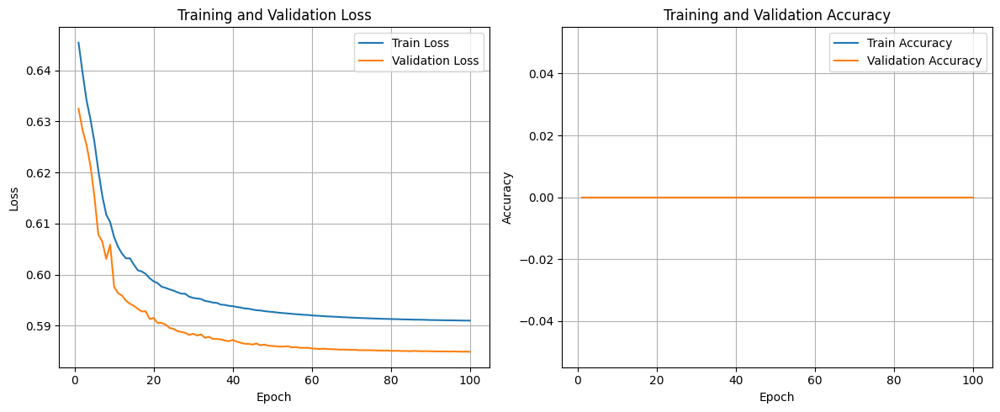

In [12]:
# Visualize training history
plot_history(history)

In [ ]:
# Load the best model
model_path = trainer.best_model_path
model_path = str(LOG_DIR / model.__class__.__name__ / 'best' / 'run_01.pt')
trainer.load_best_model(model_path)

In [14]:
# Evaluate the model on the test set (a good example)
test_loss_good, y_true_good, y_pred_good = trainer.evaluate()

test_loss: 0.5884


In [15]:
# Evaluate the model on a bad example
bad_dataset = HexaboardDataset(root=DATA_DIR / 'bad_example', transform=transform)
trainer.test_loader = DataLoader(
    dataset=bad_dataset,
    batch_size=train_config.batch_size,
    shuffle=False,
    num_workers=train_config.num_workers,
    pin_memory=train_config.pin_memory
)
test_loss_bad, y_true_bad, y_pred_bad = trainer.evaluate()

test_loss: 0.5929


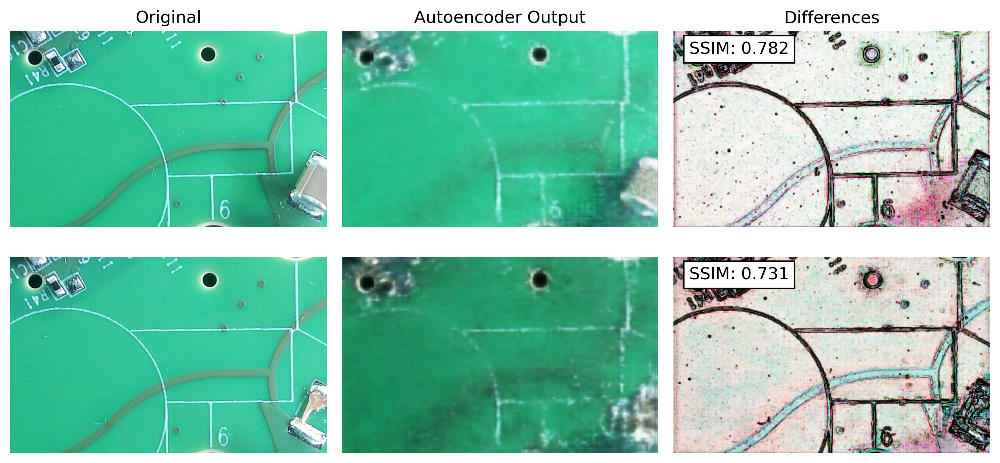

In [16]:
# Visualize the reconstruction of the good and bad hexaboards
plot_ae_comparison(
    y_true_good=y_true_good,
    y_pred_good=y_pred_good,
    y_true_bad=y_true_bad,
    y_pred_bad=y_pred_bad,
    segment_idx=83
)

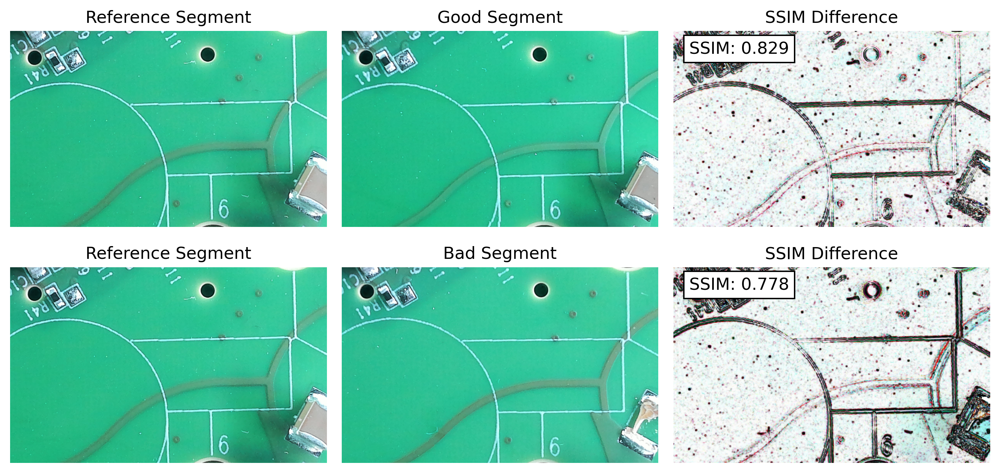

In [14]:
# Visualize the comparison between the 2 images with SSIM
reference_image = np.load(DATA_DIR / 'train' / 'aligned_images1.npy')
good_image = np.load(DATA_DIR / 'train' / 'aligned_images2.npy')
bad_image = np.load(DATA_DIR / 'bad_example' / 'aligned_images5.npy')

plot_pw_comparison(
    reference_image=reference_image,
    good_image=good_image,
    bad_image=bad_image,
    H_seg=11,
    V_seg=6
)